In [1]:
 from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
! pip install kaggle

In [3]:
! mkdir  ~/.kaggle

In [4]:
! cp kaggle.json ~/.kaggle/

In [5]:
!  chmod 600 ~/.kaggle/kaggle.json

In [6]:
! kaggle datasets download -d shaunthesheep/microsoft-catsvsdogs-dataset

100% 788M/788M [00:37<00:00, 25.3MB/s]
100% 788M/788M [00:37<00:00, 22.1MB/s]


In [7]:
import zipfile
zip_ref = zipfile.ZipFile('/content/microsoft-catsvsdogs-dataset.zip', 'r')   #nazwa pliku z API command
zip_ref.extractall('/content/')
zip_ref.close()

In [8]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import cv2
import os
import PIL
from PIL import Image

import random
%matplotlib inline
import cv2
import datetime

import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Model
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Rescaling, Activation, BatchNormalization, ZeroPadding2D
from keras.optimizers import Adam
from keras.metrics import categorical_crossentropy
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.layers import BatchNormalization
from keras import regularizers, optimizers
from keras.callbacks import ModelCheckpoint,ReduceLROnPlateau,EarlyStopping,LearningRateScheduler,CSVLogger,LambdaCallback,TensorBoard
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg19 import VGG19

import time
import glob
import matplotlib.image as matimage
import plotly.express as px


In [ ]:
! pip install rembg
import rembg

In [9]:
!pip3 install livelossplot
from livelossplot import PlotLossesKeras

In [ ]:
img = cv2.imread("PetImages/Dog/12499.jpg")
type(img)

numpy.ndarray

In [ ]:
img = cv2.imread("PetImages/Cat/12499.jpg")
type(img)

numpy.ndarray

In [ ]:
#img_folder_dog = r'PetImages/Dog/'

In [ ]:
#img_folder_cat = r'PetImages/Cat/'

In [ ]:
img_folder = r'PetImages/'

In [ ]:
def explore_class(class_name:str, nsamples:int):

    if nsamples%5 == 0:
        nrows = int(nsamples/5)
    else:
        nrows = int(nsamples//5 + 1)

    path = f'{img_folder}{class_name}'
    plt.figure(figsize=(20,3.5*nrows))
    plt.suptitle(f"Class: {class_name}, number of samples: {len(os.listdir(path))}")
    for i in range(nsamples):
        file = random.choice(os.listdir(path))
        image_path= os.path.join(path, file)
        img=cv2.imread(image_path)
        image_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        ax=plt.subplot(nrows,5,i+1)
        ax.title.set_text(file)

        plt.imshow(image_rgb)

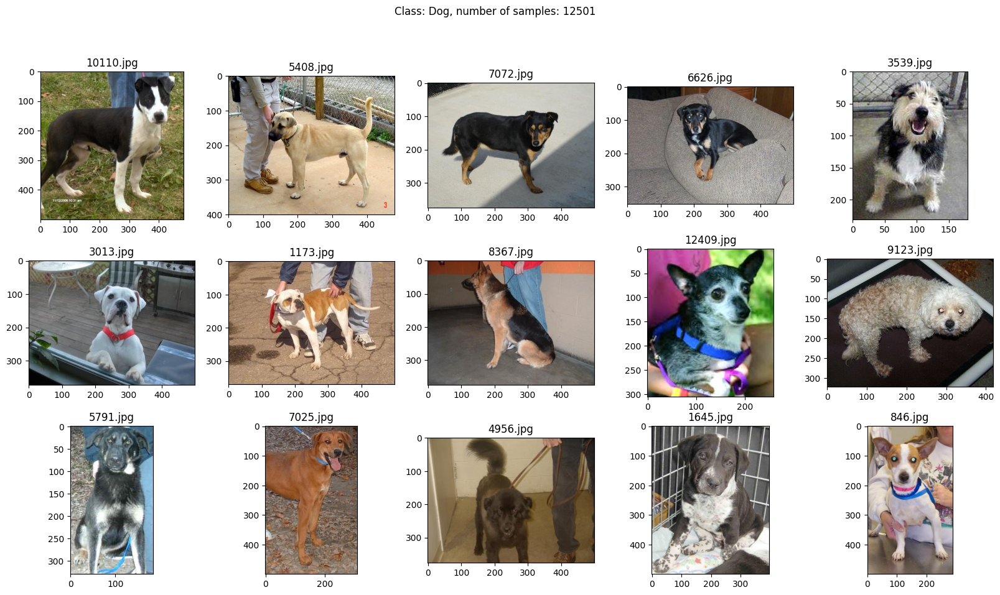

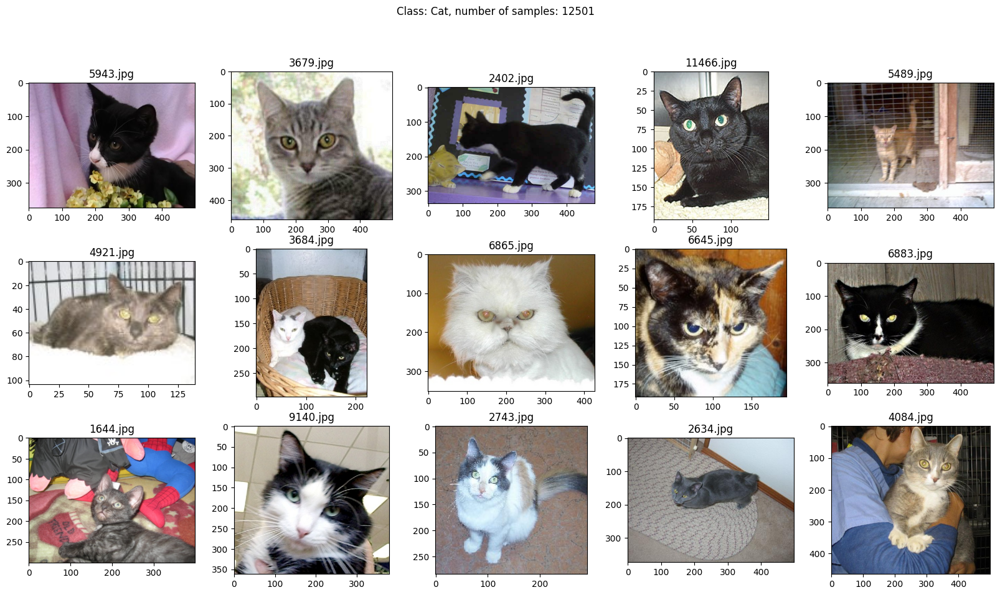

In [ ]:
explore_class('Dog',15)
explore_class('Cat',15)

In [ ]:
counter = {}

def count_size(img_folder,counter):

    for dir in os.listdir(img_folder):
        counter[dir]={}
        for file in os.listdir(os.path.join(img_folder, dir)):
            image_path= os.path.join(img_folder, dir,  file)
            image=cv2.imread(image_path)
            size = img.shape
            if size not in counter[dir]:
                counter[dir][size]=1
            else:
                counter[dir][size]+=1

In [ ]:
count_size(img_folder,counter)
counter

{'Cat': {(419, 408, 3): 12501}, 'Dog': {(419, 408, 3): 12501}}

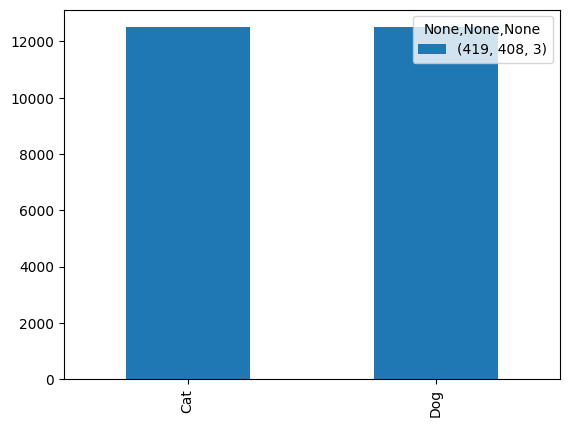

In [ ]:
df = pd.DataFrame.from_dict(counter, orient='index')
df.plot(kind='bar')
pass

In [10]:
SOURCE_PATH = '/content/PetImages'

# os.listdir returns a list containing all files under the given path
start = time.time()
CAT_PATH = os.listdir(os.path.join(SOURCE_PATH, 'Cat'))
DOG_PATH = os.listdir(os.path.join(SOURCE_PATH, 'Dog'))

CAT_PATH = list(map(lambda x : os.path.join(SOURCE_PATH+"/Cat", x), CAT_PATH))
DOG_PATH = list(map(lambda x : os.path.join(SOURCE_PATH+"/Dog", x), DOG_PATH))
end = time.time()

print(f"{len(CAT_PATH)} cats img")
print(f"{len(DOG_PATH)} dogs img")
print(f'\n{end-start} sec.')

12501 cats img
12501 dogs img

0.08977079391479492 sec.


In [11]:
df = pd.DataFrame({"path":CAT_PATH+DOG_PATH,"label":[0]*len(CAT_PATH)+[1]*len(DOG_PATH)})
df.head()

,path,label
0,/content/PetImages/Cat/4993.jpg,0
1,/content/PetImages/Cat/7000.jpg,0
2,/content/PetImages/Cat/11383.jpg,0
3,/content/PetImages/Cat/4997.jpg,0
4,/content/PetImages/Cat/1309.jpg,0


In [ ]:
df.shape

(25002, 2)

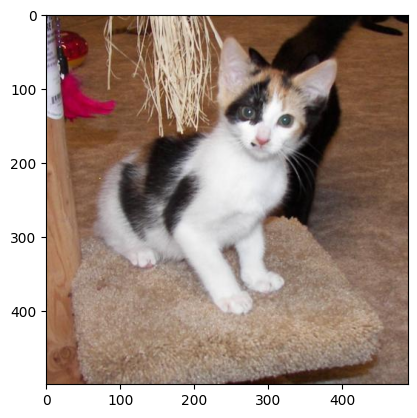

In [ ]:
img = cv2.cvtColor(cv2.imread(df.iloc[0,0]), cv2.COLOR_BGR2RGB)
plt.imshow(img)

In [12]:
def data_check():
    """
        check each image file for corrupted or missing
    """
    error = []
    start = time.time()
    for i in range(len(df)):
        try:                    # checks for corrupeted or missing image files
            if len(cv2.imread(df.iloc[i,0])) == 3:
                _ = 1
        except:
            print(i)
            error.append(df.iloc[i,0])
    end = time.time()
    print(f'\n{end-start} sec.')
    return error

In [13]:
remove = data_check()

36
118
363
489
517
742
1019
1124
1392
1909
2323
3856
3935
4087
4863
5024
6000
6839
7555
7953
9358
9509
9524
9869
10304
12717
13318
13334
13493
14545
16351
16751
16978
17081
17389
18242
18541
18794
19132
19272
20584
21301
21992
22805
22925
23090
23283
23347
23453
23467
23470
24144
24283
24521
24620
24718

53.76842975616455 sec.


In [14]:
df = df[~df["path"].isin(remove)]

In [15]:
df

,path,label
0,/content/PetImages/Cat/4993.jpg,0
1,/content/PetImages/Cat/7000.jpg,0
2,/content/PetImages/Cat/11383.jpg,0
3,/content/PetImages/Cat/4997.jpg,0
4,/content/PetImages/Cat/1309.jpg,0
...,...,...
24997,/content/PetImages/Dog/715.jpg,1
24998,/content/PetImages/Dog/4790.jpg,1
24999,/content/PetImages/Dog/7577.jpg,1
25000,/content/PetImages/Dog/9589.jpg,1


In [16]:
df['path'][12475:12477]

12500    /content/PetImages/Cat/5441.jpg
12501    /content/PetImages/Dog/4993.jpg
Name: path, dtype: object

In [17]:
X_train, X_test, y_train, y_test = train_test_split(df['path'][11475:13477], df['label'][11475:13477], test_size=0.1, random_state=42)

df_train = pd.DataFrame({"path":X_train,"label":y_train})
df_test = pd.DataFrame({"path":X_test,"label":y_test})

df_train['label'] = df_train['label'].astype(str)
df_test['label'] = df_test['label'].astype(str)


In [18]:
train_datagen = ImageDataGenerator(rescale=1 / 255.0, validation_split=0.20)

In [19]:
test_datagen = ImageDataGenerator(rescale=1 / 255.0)

In [20]:
image_size = 224
input_shape = (image_size, image_size, 3)

epochs = 200
batch_size = 32

==============================

In [ ]:
train_datagen_2 = ImageDataGenerator(
    zca_whitening=False,
    zca_epsilon=1e-06,
    rotation_range=15,
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    width_shift_range=0.1,
    height_shift_range=0.1
)

Found 1 validated image filenames belonging to 1 classes.


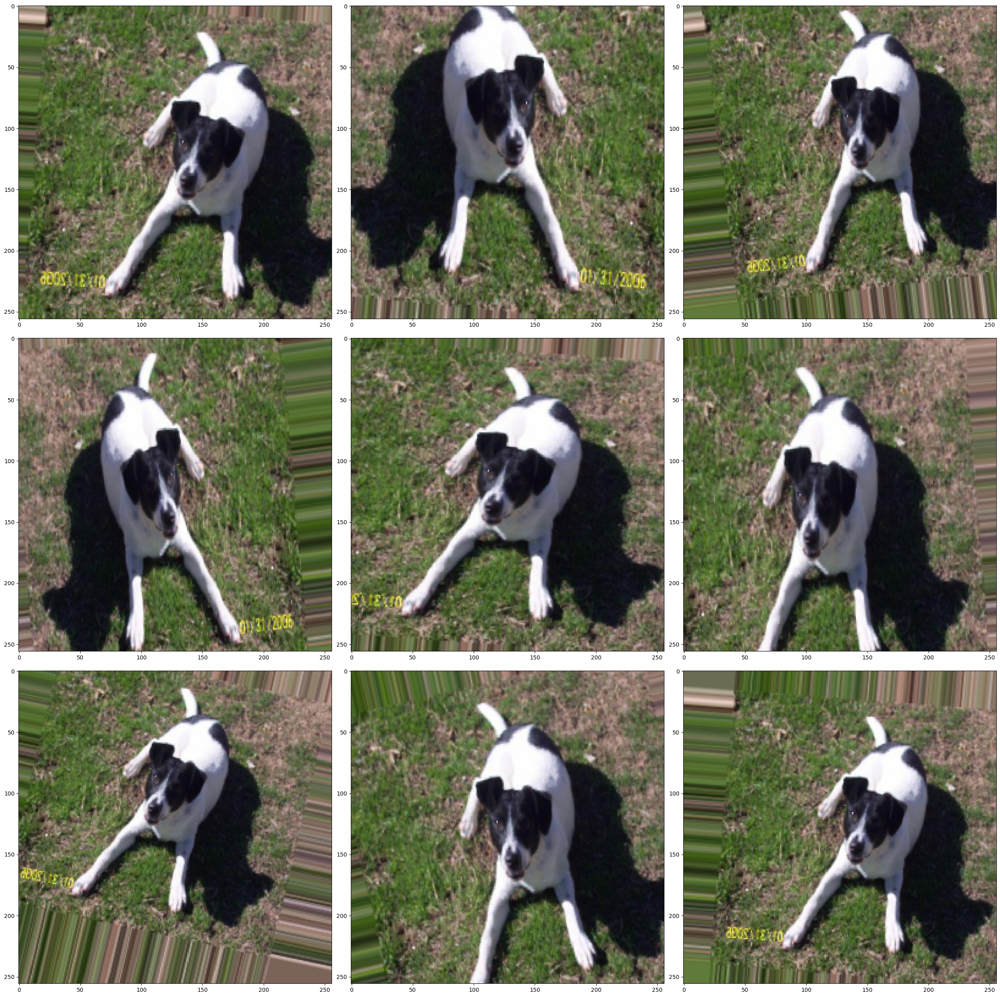

In [ ]:
df_img_example = df_train.sample(n=1).reset_index(drop=True)
df_example_generator = train_datagen_2.flow_from_dataframe(
    df_img_example,
    directory=None,
    x_col='path',
    y_col='label',
    class_mode='categorical'
)
plt.figure(figsize=(25, 25))
for i in range(0, 9):
    plt.subplot(3, 3, i+1)
    for X_batch, Y_batch in df_example_generator:
        image = X_batch[0]
        plt.imshow(image)
        break
plt.tight_layout()
plt.show()

Remove the background

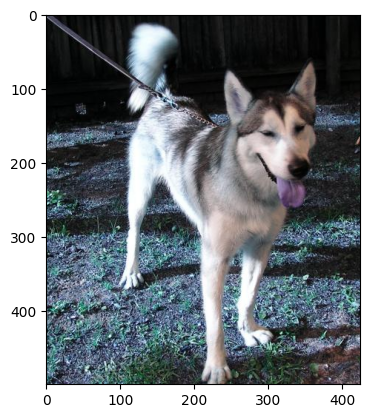

In [ ]:
img_2 = cv2.imread("PetImages/Dog/12483.jpg")
plt.imshow(img_2)

In [ ]:
from rembg import remove

input_path = 'PetImages/Dog/12483.jpg'
output_path = 'output.jpg'

with open(input_path, 'rb') as i:
    with open(output_path, 'wb') as o:
        input = i.read()
        output = remove(input)
        o.write(output)

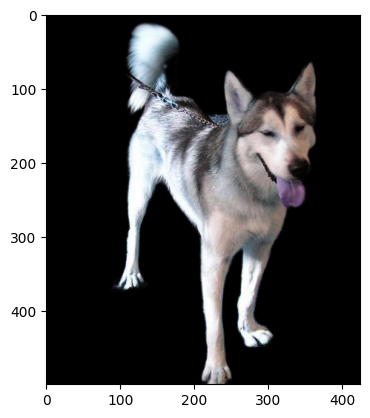

In [ ]:
img_3 = cv2.imread("output.jpg")
plt.imshow(img_3)

================================================

BINARY

Train Generator

In [21]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe=df_train,
    directory=None,
    x_col="path",
    y_col="label",
    target_size=(image_size, image_size),
    color_mode="rgb",
    class_mode='binary',
    batch_size=batch_size,
    shuffle=True,
    seed=42,
    subset='training'
)

Found 1441 validated image filenames belonging to 2 classes.


Validation Generator

In [22]:
valid_generator = train_datagen.flow_from_dataframe(
    dataframe=df_train,
    directory=None,
    x_col="path",
    y_col="label",
    target_size=(image_size, image_size),
    color_mode="rgb",
    class_mode="binary",
    batch_size=batch_size,
    shuffle=True,
    seed=42,
    subset='validation'
)

Found 360 validated image filenames belonging to 2 classes.


Test Generator

In [83]:
test_generator = test_datagen.flow_from_dataframe(
    dataframe=df_test,
    directory=None,
    x_col="path",
    y_col="label",
    target_size=(image_size, image_size),
    color_mode="rgb",
    class_mode='binary', #None
    batch_size=1,
    shuffle=False,
    seed=42
)

Found 201 validated image filenames belonging to 2 classes.


**Model VGG-16**

In [24]:
model_vgg_16 = VGG16(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

58889256/58889256 [==============================] - 3s 0us/step


In [25]:
model_vgg_16.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [26]:
#will not train
for layer in model_vgg_16.layers:
  layer.trainable = False

In [27]:
x = Flatten()(model_vgg_16.output)
predict = Dense(1, activation = 'sigmoid') (x)
final_model_vgg_16 = Model(inputs = model_vgg_16.input, outputs = predict)

In [28]:
final_model_vgg_16.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
#plot_model(model = final_model_vgg_16, show_shapes = True)

In [ ]:
#checkpoint = ModelCheckpoint("vgg16_1.h5",
#                             save_best_only=True,
#                             verbose=1, )

BINARY

In [ ]:
es_callback = keras.callbacks.EarlyStopping(patience=20)

In [ ]:
final_model_vgg_16.compile(loss="binary_crossentropy",
                      optimizer=Adam(learning_rate=0.00001),
                      metrics=['accuracy'])

In [ ]:
train_steps_size = train_generator.n//train_generator.batch_size
validation_steps_size = valid_generator.n//valid_generator.batch_size

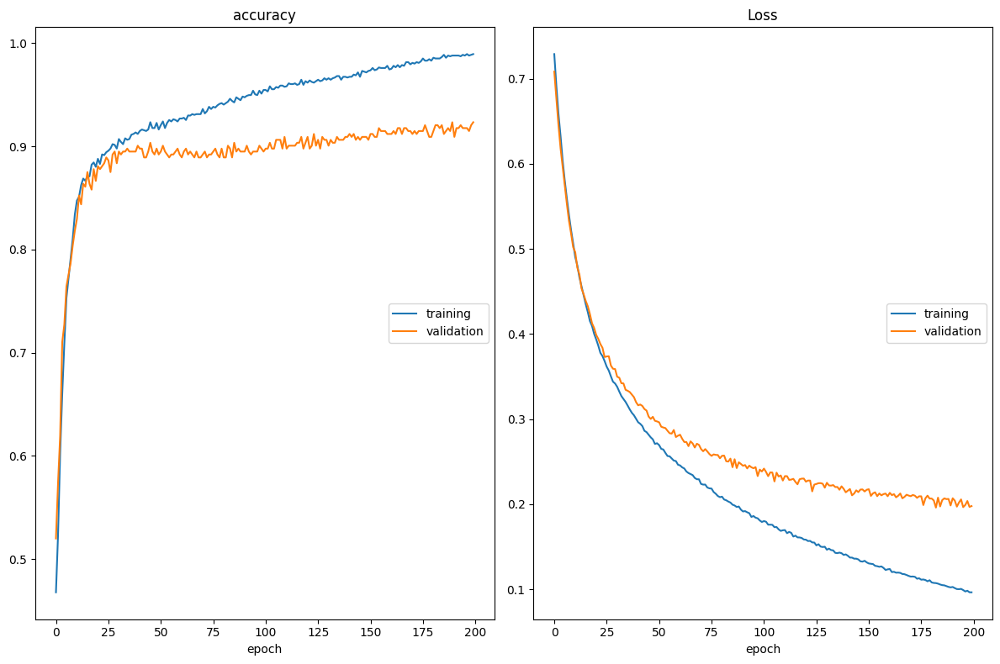

accuracy
	training         	 (min:    0.468, max:    0.989, cur:    0.989)
	validation       	 (min:    0.520, max:    0.923, cur:    0.923)
Loss
	training         	 (min:    0.097, max:    0.729, cur:    0.097)
	validation       	 (min:    0.196, max:    0.708, cur:    0.198)
45/45 [==============================] - 10s 229ms/step - loss: 0.0965 - accuracy: 0.9894 - val_loss: 0.1978 - val_accuracy: 0.9233


In [ ]:
history = final_model_vgg_16.fit_generator(train_generator,
                                          validation_data = valid_generator,
                                          steps_per_epoch = train_steps_size,
                                          validation_steps = validation_steps_size,
                                          epochs=epochs,
                                          callbacks=[es_callback, PlotLossesKeras()]
                                          )

In [ ]:
#binary
final_model_vgg_16.save('model_vgg_16.h5')

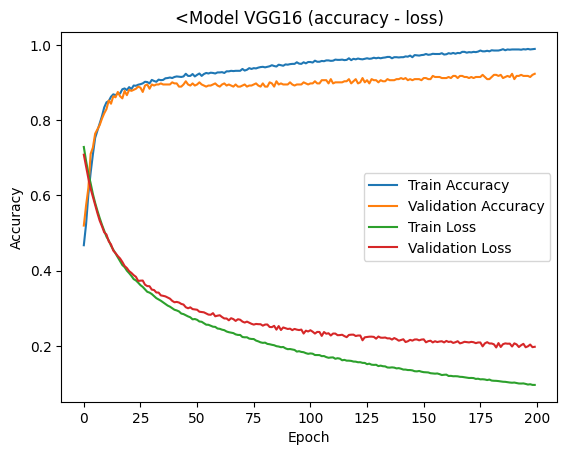

In [ ]:
plt.plot(history.history["accuracy"])
plt.plot(history.history['val_accuracy'])
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title("<Model VGG16 (accuracy - loss)")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Train Accuracy","Validation Accuracy","Train Loss","Validation Loss"])
plt.show()

Model Evaluation

In [ ]:
final_model_vgg_16.evaluate_generator(generator=valid_generator, steps=validation_steps_size)

<ipython-input-52-64fae50ef356>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  final_model_vgg_16.evaluate_generator(generator=valid_generator, steps=validation_steps_size)


[0.2032405436038971, 0.9204545617103577]

Model Binary 100 epochs

In [29]:
es_callback = keras.callbacks.EarlyStopping(patience=10)

In [30]:
final_model_vgg_16.compile(loss="binary_crossentropy",
                      optimizer=Adam(learning_rate=0.00001),
                      metrics=['accuracy'])

In [31]:
train_steps_size = train_generator.n//train_generator.batch_size
validation_steps_size = valid_generator.n//valid_generator.batch_size

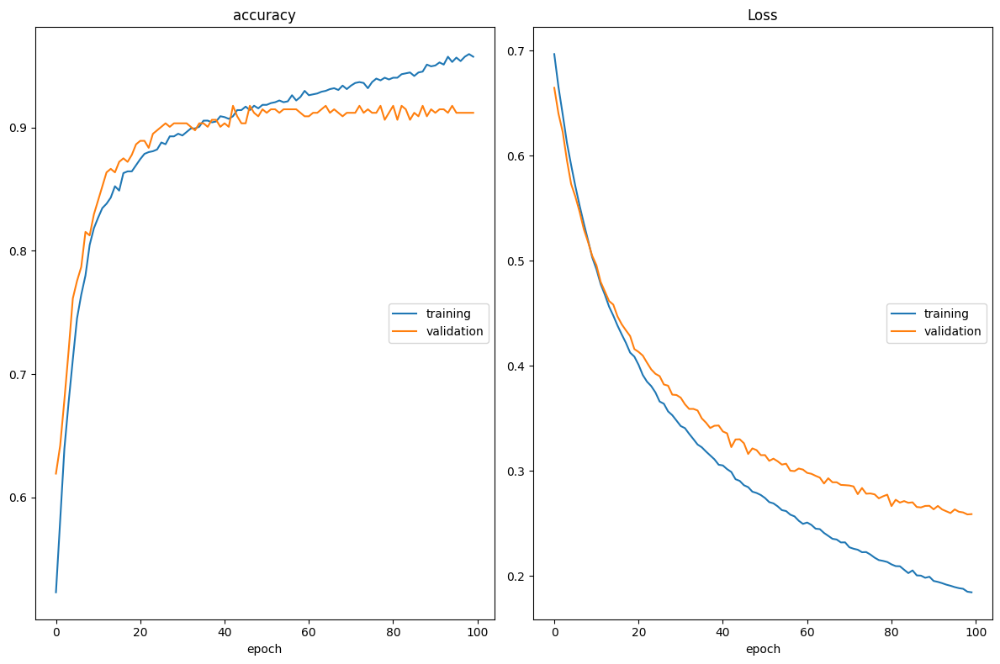

accuracy
	training         	 (min:    0.523, max:    0.960, cur:    0.957)
	validation       	 (min:    0.619, max:    0.918, cur:    0.912)
Loss
	training         	 (min:    0.184, max:    0.697, cur:    0.184)
	validation       	 (min:    0.258, max:    0.665, cur:    0.259)
45/45 [==============================] - 10s 216ms/step - loss: 0.1843 - accuracy: 0.9574 - val_loss: 0.2588 - val_accuracy: 0.9119


In [32]:
history_2 = final_model_vgg_16.fit_generator(train_generator,
                                          validation_data = valid_generator,
                                          steps_per_epoch = train_steps_size,
                                          validation_steps = validation_steps_size,
                                          epochs=100,
                                          callbacks=[es_callback, PlotLossesKeras()]
                                          )

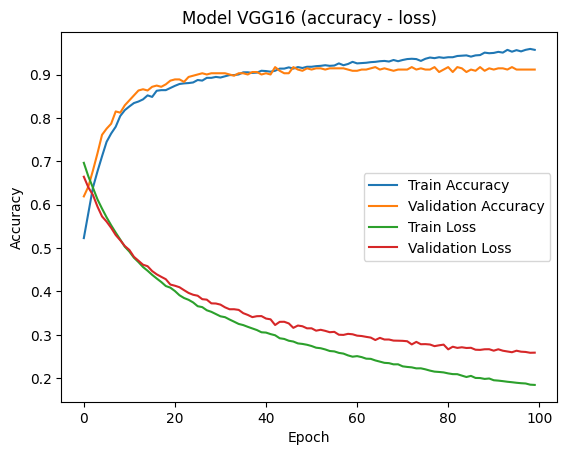

In [33]:
plt.plot(history_2.history["accuracy"])
plt.plot(history_2.history['val_accuracy'])
plt.plot(history_2.history['loss'])
plt.plot(history_2.history['val_loss'])
plt.title("Model VGG16 (accuracy - loss)")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Train Accuracy","Validation Accuracy","Train Loss","Validation Loss"])
plt.show()

In [34]:
#save
final_model_vgg_16.save('model_vgg_16_2.h5')

Evaluation

In [35]:
final_model_vgg_16.evaluate_generator(generator=valid_generator, steps=validation_steps_size)

<ipython-input-35-64fae50ef356>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  final_model_vgg_16.evaluate_generator(generator=valid_generator, steps=validation_steps_size)


[0.2559199035167694, 0.9147727489471436]

Prediction

In [36]:
predictions = final_model_vgg_16.predict_generator(test_generator)
print(predictions)

<ipython-input-36-6ca45257bbd6>:1: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  predictions = final_model_vgg_16.predict_generator(test_generator)


[[0.96950287]
 [0.04765839]
 [0.81771773]
 [0.01073061]
 [0.9488591 ]
 [0.980183  ]
 [0.3822896 ]
 [0.8576602 ]
 [0.24456315]
 [0.76571745]
 [0.25353906]
 [0.9997969 ]
 [0.3602185 ]
 [0.36771497]
 [0.21344711]
 [0.3150538 ]
 [0.43496364]
 [0.0657077 ]
 [0.90427494]
 [0.97986275]
 [0.10574342]
 [0.9998128 ]
 [0.8144721 ]
 [0.3006459 ]
 [0.9563968 ]
 [0.6447836 ]
 [0.9417314 ]
 [0.5024879 ]
 [0.06991147]
 [0.3459772 ]
 [0.06599166]
 [0.63744354]
 [0.02822527]
 [0.9448083 ]
 [0.99675304]
 [0.30567887]
 [0.61824775]
 [0.7536035 ]
 [0.9443756 ]
 [0.48831812]
 [0.03148701]
 [0.9103536 ]
 [0.19927481]
 [0.11135449]
 [0.70963275]
 [0.9218134 ]
 [0.04681942]
 [0.5920734 ]
 [0.19560377]
 [0.98641694]
 [0.9986303 ]
 [0.14280091]
 [0.81228226]
 [0.01097052]
 [0.02264361]
 [0.8026757 ]
 [0.02552608]
 [0.8422234 ]
 [0.8946906 ]
 [0.27911177]
 [0.92573196]
 [0.25858924]
 [0.6873737 ]
 [0.9943937 ]
 [0.82988983]
 [0.92077863]
 [0.00708694]
 [0.94565225]
 [0.7794647 ]
 [0.24840526]
 [0.00791809]
 [0.05

In [57]:
threshold = 0.55
binary_predictions = [1 if pred > threshold else 0 for pred in predictions]

In [58]:
num_predictions = len(binary_predictions)
test_image_ids = list(range(1, num_predictions + 1))
data = {'id': test_image_ids, 'label': binary_predictions}
df = pd.DataFrame(data)
print(df)

      id  label
0      1      1
1      2      0
2      3      1
3      4      0
4      5      1
..   ...    ...
196  197      1
197  198      1
198  199      0
199  200      1
200  201      1

[201 rows x 2 columns]


In [39]:
csv_file_path = 'predict_result.csv'
df.to_csv(csv_file_path, index=False)

In [59]:
#confusion_matrix
cm = confusion_matrix(test_generator.classes, binary_predictions)

In [60]:
#classification_report
clr = classification_report(test_generator.labels, binary_predictions, labels=[0, 1])

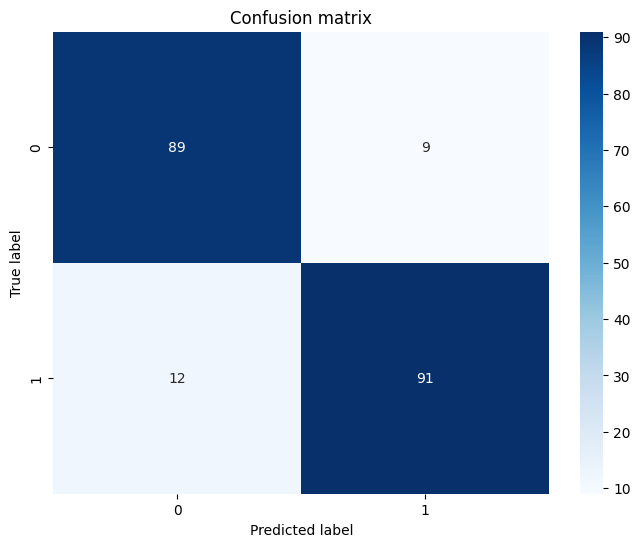

Classification Report:
----------------------
               precision    recall  f1-score   support

           0       0.88      0.91      0.89        98
           1       0.91      0.88      0.90       103

    accuracy                           0.90       201
   macro avg       0.90      0.90      0.90       201
weighted avg       0.90      0.90      0.90       201



In [61]:
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cbar=True, cmap='Blues',xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion matrix')
plt.show()

print("Classification Report:\n----------------------\n", clr)

**Model VGG19**

BINARY

In [62]:
model_vgg_19 = VGG19(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

80134624/80134624 [==============================] - 5s 0us/step


In [63]:
model_vgg_19.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [64]:
#will not train
for layer in model_vgg_19.layers:
  layer.trainable = False

In [65]:
x = Flatten()(model_vgg_19.output)
predict = Dense(1, activation = 'sigmoid') (x)
final_model_vgg_19 = Model(inputs = model_vgg_19.input, outputs = predict)

In [66]:
final_model_vgg_19.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [67]:
es_callback = keras.callbacks.EarlyStopping(patience=10)

In [68]:
final_model_vgg_19.compile(loss="binary_crossentropy",
                      optimizer=Adam(learning_rate=0.00001),
                      metrics=['accuracy'])

In [69]:
train_steps_size = train_generator.n//train_generator.batch_size
validation_steps_size = valid_generator.n//valid_generator.batch_size

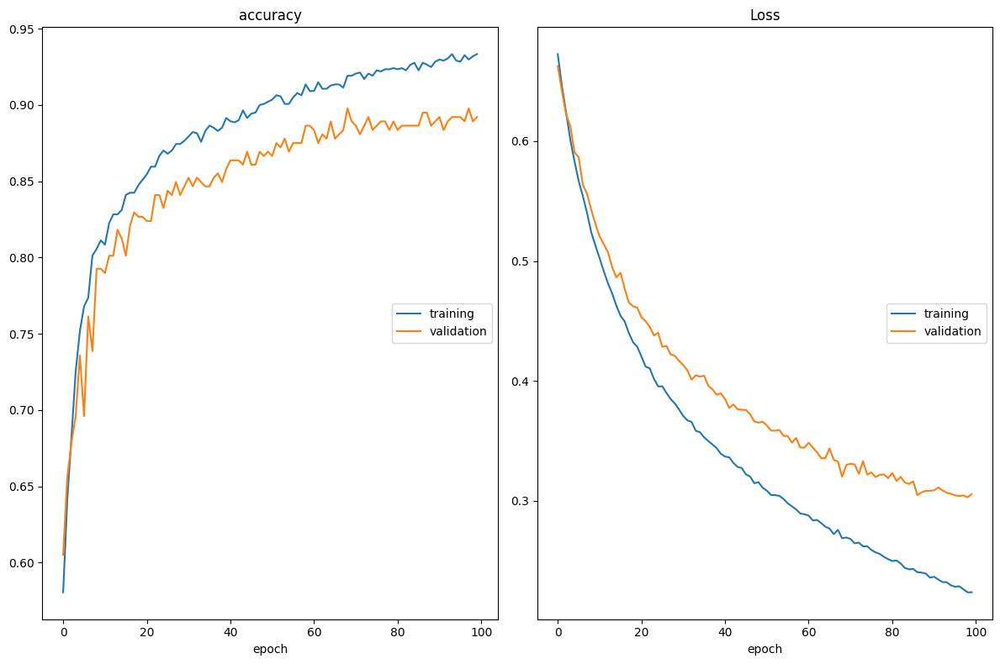

accuracy
	training         	 (min:    0.581, max:    0.933, cur:    0.933)
	validation       	 (min:    0.605, max:    0.898, cur:    0.892)
Loss
	training         	 (min:    0.224, max:    0.673, cur:    0.224)
	validation       	 (min:    0.303, max:    0.663, cur:    0.306)
45/45 [==============================] - 10s 220ms/step - loss: 0.2238 - accuracy: 0.9333 - val_loss: 0.3056 - val_accuracy: 0.8920


In [70]:
history = final_model_vgg_19.fit_generator(train_generator,
                                          validation_data = valid_generator,
                                          steps_per_epoch = train_steps_size,
                                          validation_steps = validation_steps_size,
                                          epochs=100,
                                          callbacks=[es_callback, PlotLossesKeras()]
                                          )

In [71]:
final_model_vgg_19.save('model_vgg_19.h5')

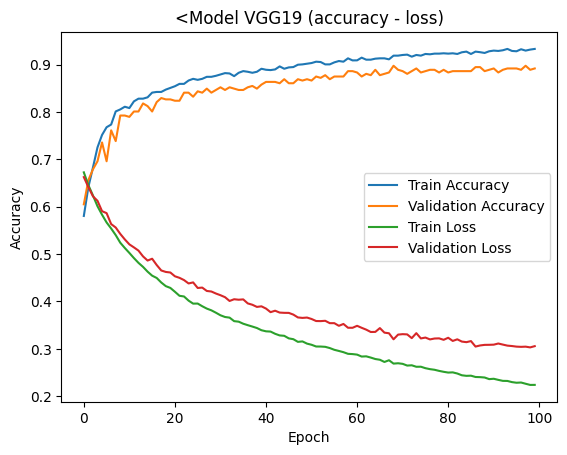

In [72]:
plt.plot(history.history["accuracy"])
plt.plot(history.history['val_accuracy'])
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title("<Model VGG19 (accuracy - loss)")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Train Accuracy","Validation Accuracy","Train Loss","Validation Loss"])
plt.show()

In [73]:
final_model_vgg_19.evaluate_generator(generator=valid_generator, steps=validation_steps_size)

<ipython-input-73-5ac8213f263d>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  final_model_vgg_19.evaluate_generator(generator=valid_generator, steps=validation_steps_size)


[0.30366596579551697, 0.8948863744735718]

In [75]:
predictions_2 = final_model_vgg_19.predict_generator(test_generator)
print(predictions_2)

<ipython-input-75-6c2314898444>:1: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  predictions_2 = final_model_vgg_19.predict_generator(test_generator)


[[0.9517557 ]
 [0.04084449]
 [0.83714056]
 [0.01760273]
 [0.9290654 ]
 [0.94553185]
 [0.20525199]
 [0.835069  ]
 [0.34301662]
 [0.91185635]
 [0.5390858 ]
 [0.9989116 ]
 [0.49213278]
 [0.45297012]
 [0.11939362]
 [0.32286513]
 [0.46316406]
 [0.08360883]
 [0.9513115 ]
 [0.9661479 ]
 [0.13826227]
 [0.9993772 ]
 [0.9636117 ]
 [0.7408783 ]
 [0.9743264 ]
 [0.68494356]
 [0.86501765]
 [0.7328334 ]
 [0.08750105]
 [0.4950224 ]
 [0.14877295]
 [0.46140426]
 [0.04834883]
 [0.949903  ]
 [0.99879754]
 [0.26126188]
 [0.38707566]
 [0.6607794 ]
 [0.9610214 ]
 [0.7391023 ]
 [0.01208154]
 [0.93847483]
 [0.07721223]
 [0.0767225 ]
 [0.78040045]
 [0.94132245]
 [0.05008385]
 [0.6605221 ]
 [0.15940094]
 [0.97651905]
 [0.99694234]
 [0.12233967]
 [0.6274406 ]
 [0.0055108 ]
 [0.03986312]
 [0.7752011 ]
 [0.0287473 ]
 [0.9710423 ]
 [0.85927045]
 [0.19255131]
 [0.9301899 ]
 [0.08369961]
 [0.42717394]
 [0.9221266 ]
 [0.8985444 ]
 [0.6538137 ]
 [0.00583234]
 [0.9572329 ]
 [0.89209175]
 [0.35768387]
 [0.0097294 ]
 [0.07

In [92]:
threshold = 0.6
binary_predictions_2 = [1 if pred > threshold else 0 for pred in predictions_2]

In [93]:
num_predictions_2 = len(binary_predictions_2)
test_image_ids_2 = list(range(1, num_predictions_2 + 1))
data_2 = {'id': test_image_ids_2, 'label': binary_predictions_2}
df_2 = pd.DataFrame(data_2)
print(df_2)

      id  label
0      1      1
1      2      0
2      3      1
3      4      0
4      5      1
..   ...    ...
196  197      1
197  198      1
198  199      0
199  200      1
200  201      1

[201 rows x 2 columns]


In [94]:
#confusion_matrix
cm_2 = confusion_matrix(test_generator.classes, binary_predictions_2)

In [95]:
#classification_report
clr_2 = classification_report(test_generator.labels, binary_predictions_2, labels=[0, 1])

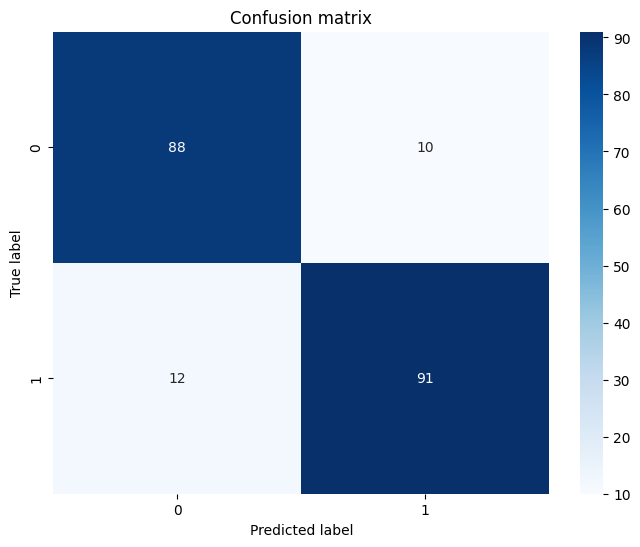

Classification Report:
----------------------
               precision    recall  f1-score   support

           0       0.88      0.90      0.89        98
           1       0.90      0.88      0.89       103

    accuracy                           0.89       201
   macro avg       0.89      0.89      0.89       201
weighted avg       0.89      0.89      0.89       201



In [96]:
plt.figure(figsize=(8,6))
sns.heatmap(cm_2, annot=True, fmt='d', cbar=True, cmap='Blues',xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion matrix')
plt.show()

print("Classification Report:\n----------------------\n", clr_2)

**Model VGG16**

CATEGORICAL

In [ ]:
#train_generator_c
train_generator_c = train_datagen.flow_from_dataframe(
    dataframe=df_train,
    directory=None,
    x_col="path",
    y_col="label",
    target_size=(image_size, image_size),
    color_mode="rgb",
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=True,
    seed=42,
    subset='training'
)

# valid_generator_c
valid_generator_c = train_datagen.flow_from_dataframe(
    dataframe=df_train,
    directory=None,
    x_col="path",
    y_col="label",
    target_size=(image_size, image_size),
    color_mode="rgb",
    class_mode="categorical",
    batch_size=batch_size,
    shuffle=True,
    seed=42,
    subset='validation'
)

Found 1441 validated image filenames belonging to 2 classes.
Found 360 validated image filenames belonging to 2 classes.


In [ ]:
x_c = Flatten()(model_vgg_16.output)
predict = Dense(2, activation = 'softmax') (x_c)
final_model_vgg_16_2 = Model(inputs = model_vgg_16.input, outputs = predict)

In [ ]:
es_callback_2 = keras.callbacks.EarlyStopping(patience=20)

In [ ]:
final_model_vgg_16_2.compile(loss="categorical_crossentropy",
                      optimizer=Adam(learning_rate=0.00001),
                      metrics=['accuracy'])

In [ ]:
train_steps_size_2 = train_generator_c.n//train_generator_c.batch_size
validation_steps_size_2 = valid_generator_c.n//valid_generator_c.batch_size

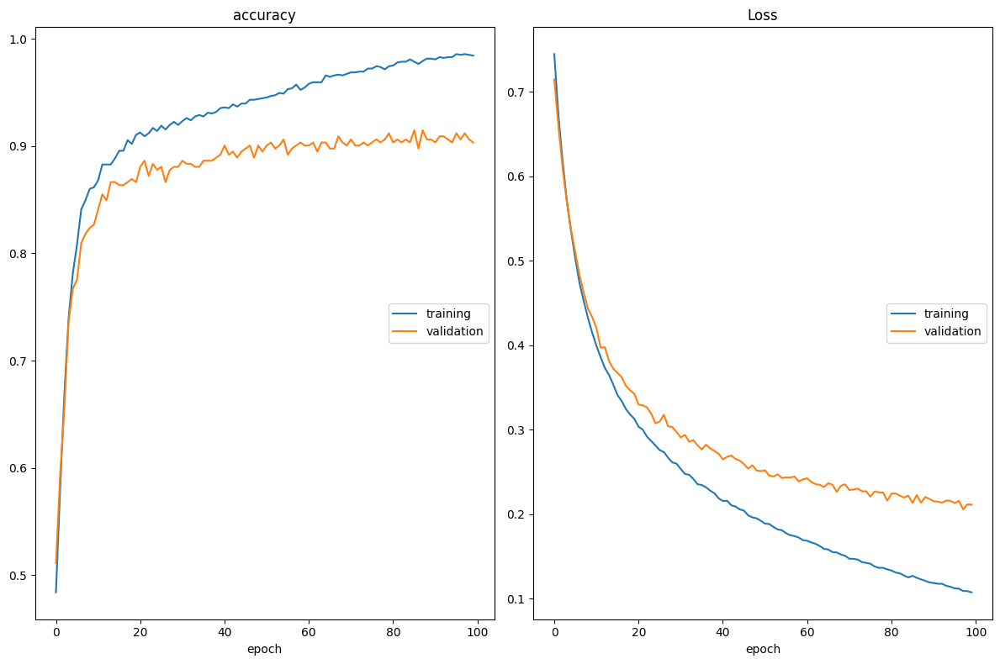

accuracy
	training         	 (min:    0.484, max:    0.986, cur:    0.984)
	validation       	 (min:    0.511, max:    0.915, cur:    0.903)
Loss
	training         	 (min:    0.108, max:    0.744, cur:    0.108)
	validation       	 (min:    0.206, max:    0.715, cur:    0.211)
45/45 [==============================] - 11s 249ms/step - loss: 0.1077 - accuracy: 0.9844 - val_loss: 0.2115 - val_accuracy: 0.9034


In [ ]:
history_2 = final_model_vgg_16_2.fit_generator(train_generator_c,
                                          validation_data = valid_generator_c,
                                          steps_per_epoch = train_steps_size_2,
                                          validation_steps = validation_steps_size_2,
                                          epochs=100,
                                          callbacks=[es_callback_2, PlotLossesKeras()]
                                          )

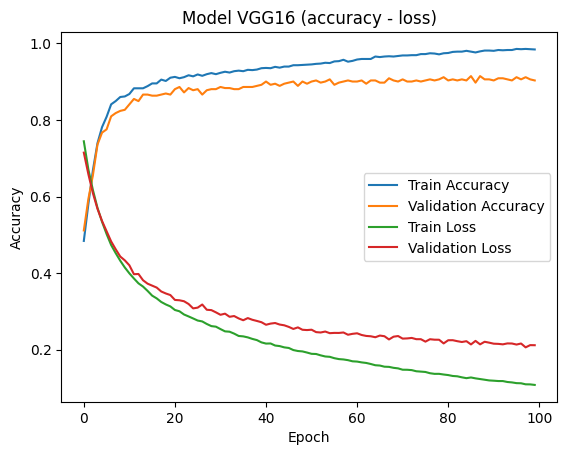

In [ ]:
plt.plot(history_2.history["accuracy"])
plt.plot(history_2.history['val_accuracy'])
plt.plot(history_2.history['loss'])
plt.plot(history_2.history['val_loss'])
plt.title("Model VGG16 (accuracy - loss)")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Train Accuracy","Validation Accuracy","Train Loss","Validation Loss"])
plt.show()

Model Evaluation

In [ ]:
final_model_vgg_16_2.evaluate_generator(generator=valid_generator_c, steps=validation_steps_size_2)

<ipython-input-86-b87e5ff4aa81>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  final_model_vgg_16_2.evaluate_generator(generator=valid_generator_c, steps=validation_steps_size_2)


[0.21449480950832367, 0.9034090638160706]

In [ ]:
#categorical
final_model_vgg_16_2.save('content/drive/MyDrive/projekt_DL/model/model_vgg_16_2.h5')

Test Model

1/1 [==============================] - 0s 147ms/step
This is a dog


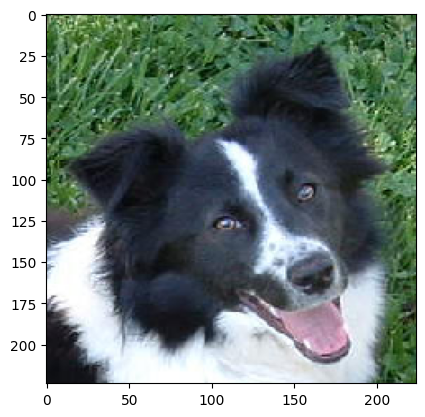

In [ ]:
from tensorflow.keras.preprocessing import image
img = image.load_img("PetImages/Dog/12494.jpg", target_size=(224,224))
img = np.asarray(img)
plt.imshow(img)
img = np.expand_dims(img, axis=0)
from keras.models import load_model
saved_model = load_model("content/drive/MyDrive/projekt_DL/model/model_vgg_16_2.h5")
output = saved_model.predict(img)
if output[0][0] > output[0][1]:
    print("This is a cat")
else:
    print('This is a dog')

Predict the output

In [ ]:
test_step_size = test_generator.n//test_generator.batch_size

test_generator.reset()
pred=final_model_vgg_16_2.predict_generator(test_generator, steps=test_step_size, verbose=1)

<ipython-input-90-b5d160142e7f>:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  pred=final_model_vgg_16_2.predict_generator(test_generator, steps=test_step_size, verbose=1)


201/201 [==============================] - 2s 9ms/step


In [ ]:
#predict = pred
#threshold = 0.5
#test_model['label'] = np.where(predict > threshold, 1,0)

In [ ]:
predicted_class_indices=np.argmax(pred, axis=1)

In [ ]:
labels = (train_generator_c.class_indices)
labels = dict((v,k) for k,v in labels.items())
predictions = [labels[k] for k in predicted_class_indices]

In [ ]:
filenames=test_generator.filenames
results=pd.DataFrame({"Filename":filenames,
                      "Predictions":predictions})

In [ ]:
results['Predictions'] = results['Predictions'].astype(int)

In [ ]:
results.to_csv("results.csv",index=False)

In [ ]:
results

,Filename,Predictions
0,/content/PetImages/Dog/12153.jpg,1
1,/content/PetImages/Cat/7426.jpg,0
2,/content/PetImages/Dog/4976.jpg,1
3,/content/PetImages/Cat/3321.jpg,0
4,/content/PetImages/Dog/12245.jpg,1
...,...,...
196,/content/PetImages/Dog/5554.jpg,1
197,/content/PetImages/Dog/12365.jpg,1
198,/content/PetImages/Cat/12096.jpg,0
199,/content/PetImages/Cat/8244.jpg,0


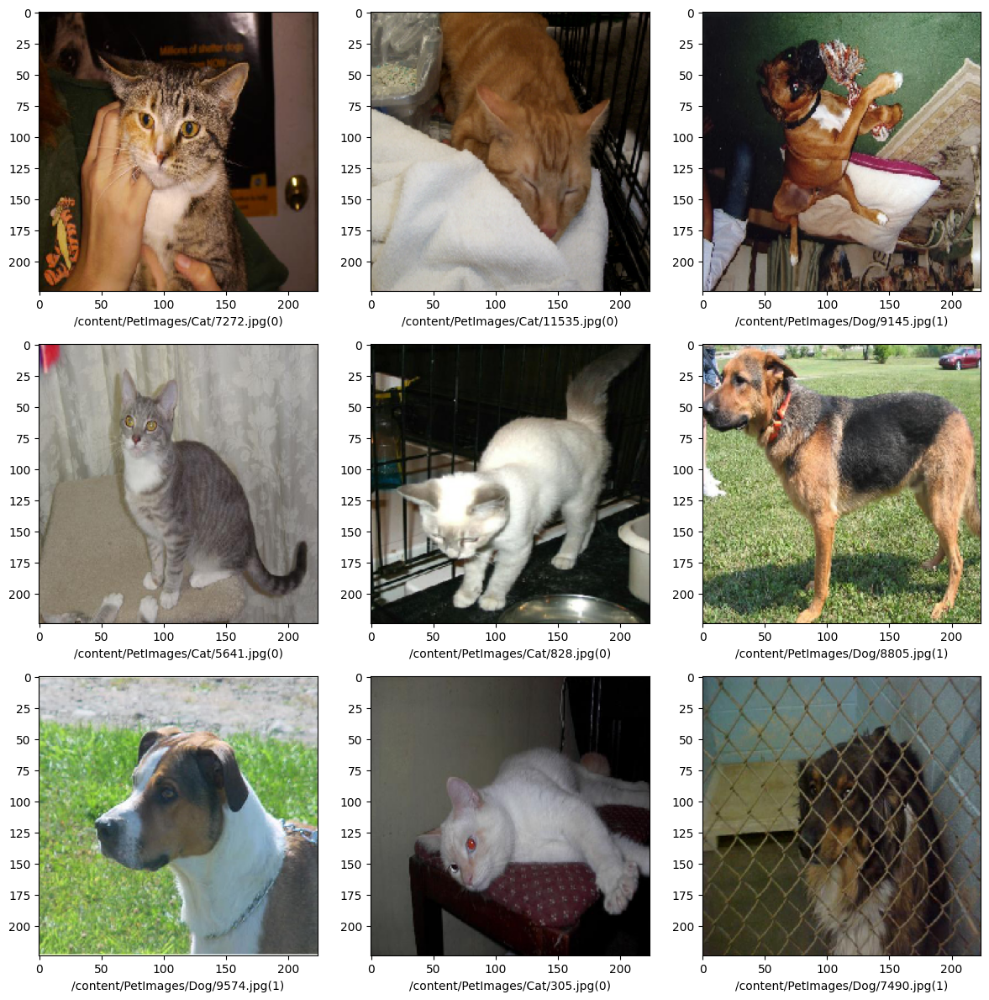

In [ ]:
sample_test = results.sample(n=9).reset_index()
sample_test.head()
plt.figure(figsize=(12, 12))
for index, row in sample_test.iterrows():
    filename = row['Filename']
    category = row['Predictions']
    img = image.load_img(""+filename, target_size=(image_size, image_size))
    plt.subplot(3, 3, index+1)
    plt.imshow(img)
    plt.xlabel(filename + '(' + "{}".format(category) + ')')
plt.tight_layout()
plt.show()

Confusion Matrix & classification report

In [ ]:
y_pred_2 = final_model_vgg_16_2.predict(test_generator)
y_pred_2 = np.argmax(y_pred_2, axis=1)

201/201 [==============================] - 3s 13ms/step


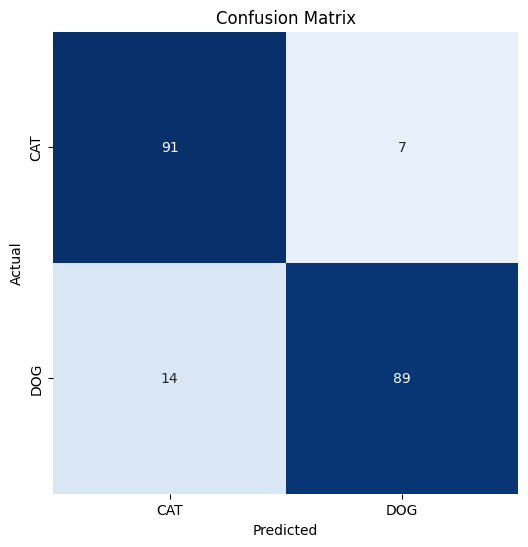

Classification Report:
----------------------
               precision    recall  f1-score   support

         CAT       0.87      0.93      0.90        98
         DOG       0.93      0.86      0.89       103

    accuracy                           0.90       201
   macro avg       0.90      0.90      0.90       201
weighted avg       0.90      0.90      0.90       201



In [ ]:
cm = confusion_matrix(test_generator.labels, y_pred_2, labels=[0, 1])
clr = classification_report(test_generator.labels, y_pred_2, labels=[0, 1], target_names=["CAT", "DOG"])
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='g', vmin=0, cmap='Blues', cbar=False)
plt.xticks(ticks=[0.5, 1.5], labels=["CAT", "DOG"])
plt.yticks(ticks=[0.5, 1.5], labels=["CAT", "DOG"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

print("Classification Report:\n----------------------\n", clr)